# List 3

## Data manipulation and statistics


### Knowledge & Skills:
- central limit theorem
- correlation
- covariance
- data acquisition
- pandas

### Remarks

1. Animation means animation, not painting again on same canvas with a wired artefact.
2. Use appropriate tools to solve tasks, if the selected tool does not allow to create animation than change the tool
3. Collaboratory allows you to create animation easily (look at List 1 code snippet)
4. Do not repeat your self, write functions and loops instead of copying code
5. Use documentation of libraries (API, tutorials etc.)
6. [Correlation != Causality](http://www.tylervigen.com/spurious-correlations)

In [1]:
%matplotlib inline

import numpy as np
import csv
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.gridspec as gridspec

from itertools import combinations
from IPython.display import HTML

Exercise 1
============

**Visualize how CLT is observable and depends on the number of trials with experiments described by Bernoulli, binomial and multinomial distributions. Explain observations.**
    
How to:

**a) Simple introduction:**
- Generate k samples of size n from an exponential distribution
- Draw a histogram of a mean value of each sample
- Create histogram animation using n parameter (animation starts with k=0, increase in each frame)


**b) Bernoulli:**
- generate k sets of n Bernoulli trials (with probability p)
- Count number of successes in each trial
- Visualize histogram of the number of successes
- Create histogram animation using n parameter (animation starts with n=0, increase in each frame)


**c) Binomial:**
- Have you alredy done it? Think about it.


**d) Multinomial:**
- Analogically in Bernoulli

In [2]:
def init(title):
    np.random.seed()
    fig, ax = plt.subplots()
    fig.suptitle(title)
    return fig, ax

def render(ax, data=[], bins=10, xlim=None, ylim=0, xlabel=''):
    ax.clear()
    n, *_ = ax.hist(data, bins=bins, range=xlim, facecolor='#137f1f', edgecolor='#0e4715')
    maxY = max(ylim, np.max(n))
    ax.set(xlim=xlim, ylim=(0, maxY), xlabel=xlabel, ylabel='Quantity')
    
def getMean(dataset):
    return np.mean(dataset, axis=1)

def getSum(dataset):
    return np.sum(dataset, axis=1)

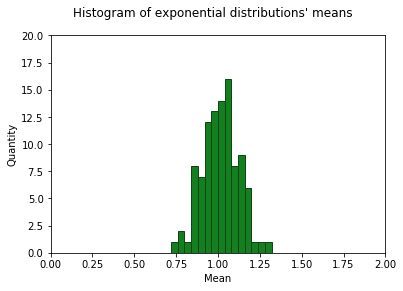

In [3]:
# Chart & animation parameters
ylim = 20
xlim = (0, 2)
xlabel = 'Mean'
interval = 80

# Experiment parameters
samples_K = 100
size_N = 100
bins = 50

# Generate samples array
samples = np.array([
    np.random.exponential(size=size_N)
    for i in range(samples_K)
])

fig, ax = init('Histogram of exponential distributions\' means')
render(ax, bins=bins, xlim=xlim, ylim=ylim, xlabel=xlabel)

def animate(i):
    data = getMean(samples[:,:i+1]) if i > 0 else []
    render(ax, data, bins=bins, xlim=xlim, ylim=ylim, xlabel=xlabel)
    return (fig,)

ani = animation.FuncAnimation(fig, animate, frames=size_N, interval=interval, blit=True)
HTML(ani.to_jshtml())

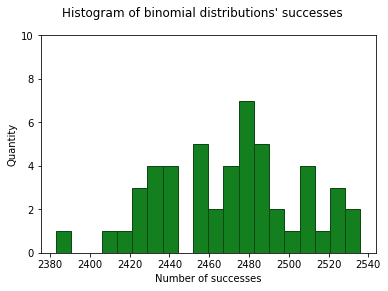

In [4]:
# Chart & animation parameters
ylim = 10
xlabel = 'Number of successes'
bins = 20
interval = 80

# Experiment parameters
samples_K = 50
size_N = 100
probability = 0.5

# Generate samples array
samples = np.array([
    np.random.binomial(np.arange(size_N), probability, size=size_N)
    for _ in range(samples_K)
])
# print(samples)
fig, ax = init('Histogram of binomial distributions\' successes')
render(ax, bins=bins, ylim=ylim, xlabel=xlabel)

def animate(i):
    data = getSum(samples[:,:i+1]) if i > 0 else []
    render(ax, data, bins=bins, ylim=ylim, xlabel=xlabel)
    return (fig,)

ani = animation.FuncAnimation(fig, animate, frames=size_N, interval=interval, blit=True)
HTML(ani.to_jshtml())

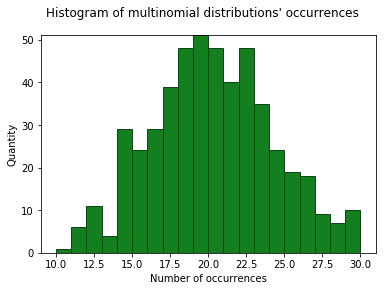

In [5]:
# Chart & animation parameters
ylim = 5
xlabel = 'Number of occurrences'
bins = 20
interval = 80

# Experiment parameters
samples_K = 100
size_N = 100

fig, ax = init('Histogram of multinomial distributions\' occurrences')
render(ax, bins=bins, ylim=ylim, xlabel=xlabel)

def animate(i):
    data = np.random.multinomial(i, [1/5.]*5, size=samples_K) if i > 0 else []
    render(ax, np.array(data).flatten(), bins=bins, ylim=ylim, xlabel=xlabel)
    return (fig,)

ani = animation.FuncAnimation(fig, animate, frames=size_N, interval=interval, blit=True)
HTML(ani.to_jshtml())

Exercise 2
============

**Acquire two appropriate datasets from [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/) (script within notebook/collaboratory, using pandas for manipulation) and provide an exploratory analysis of its content:**

Dataset requirements:

- at least five numerical attributes attributes
- at least 1000 instances

Tasks:
    
- scatter plot of EACH attribute pair (matrix of plots), on diagonal we want to see histogram of given attribute ([link](https://seaborn.pydata.org/tutorial/distributions.html), [link](https://seaborn.pydata.org/generated/seaborn.PairGrid.html#seaborn.PairGrid), [link](https://pandas.pydata.org/pandas-docs/stable/visualization.html#scatter-matrix-plot))
- scatter plot of each attribute pair with histograms on axes (write a function that generates plot for given attributes pair) ([link](https://seaborn.pydata.org/generated/seaborn.jointplot.html#seaborn.jointplot))
    - correlation (for EACH attribute pair, if appropriate)
    - covariances (for EACH attribute pair, if appropriate)

Elaborate on results.

**Wine Quality Dataset**
-----------------

(1599, 12)


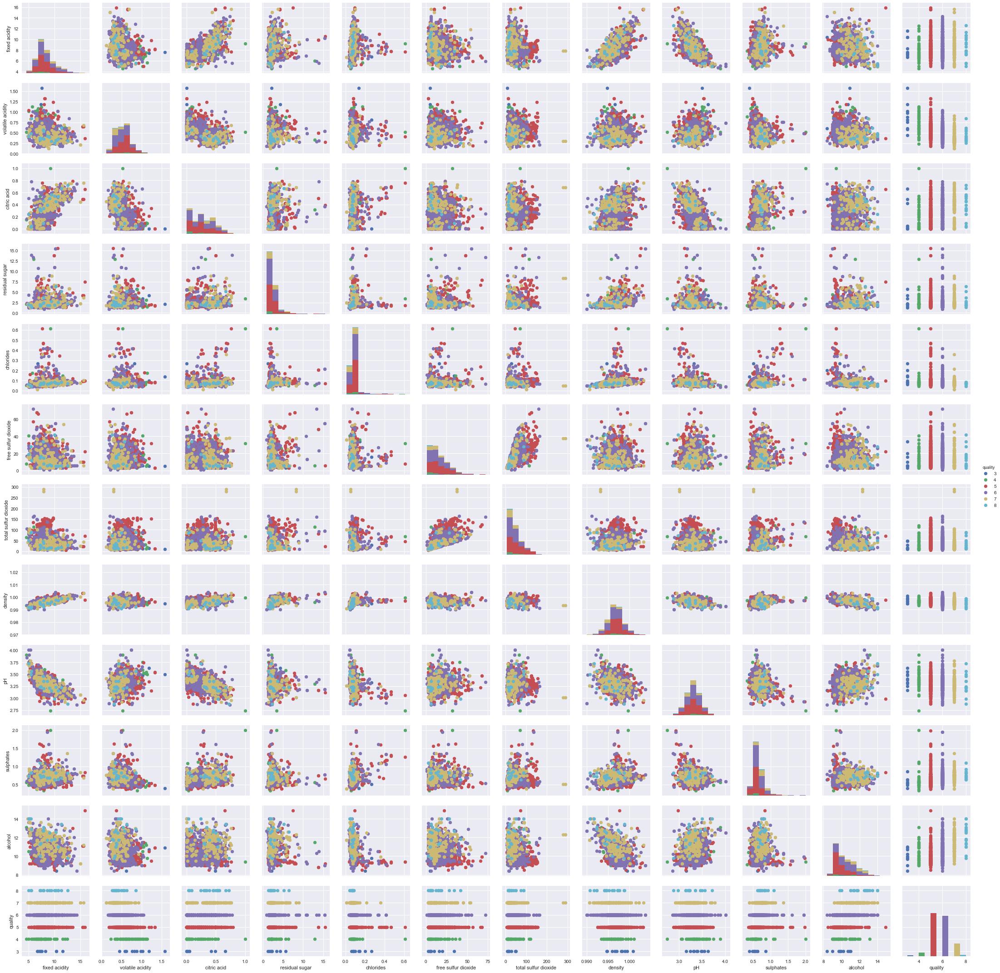

In [6]:
dataset = pd.read_csv('Data/Datasets/WineQuality/winequality-red.csv', sep=';')
print(dataset.shape)

sns.set()
g = sns.PairGrid(dataset, hue="quality")
g = g.map_diag(plt.hist)
g = g.map_offdiag(plt.scatter)
g = g.add_legend()

C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: T

C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warning

C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: T

C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: T

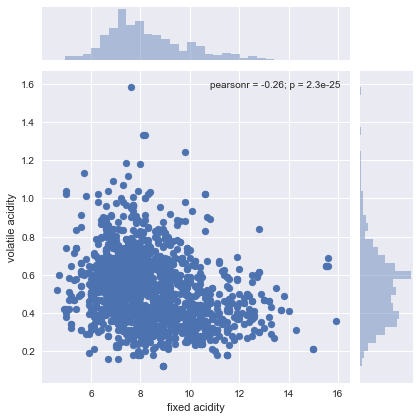

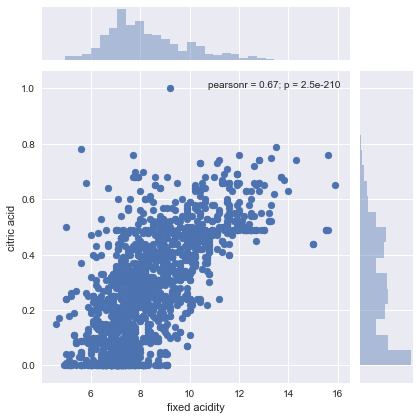

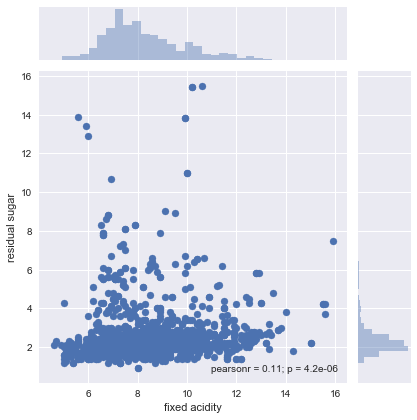

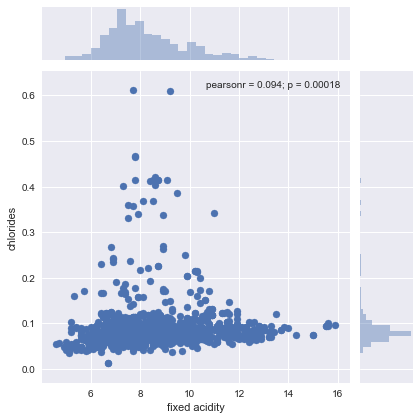

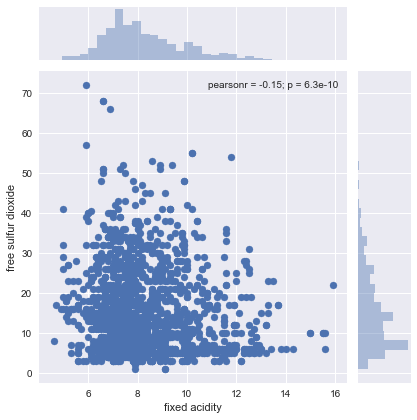

...

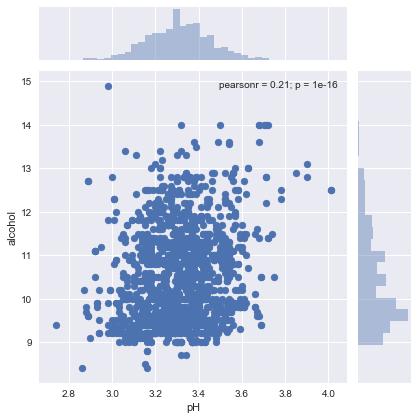

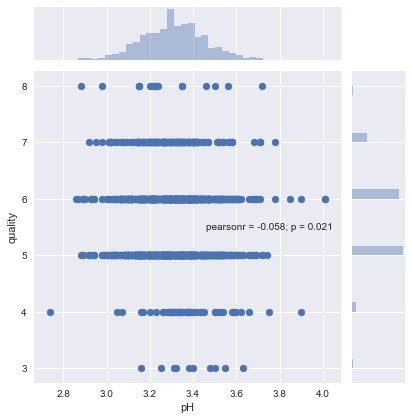

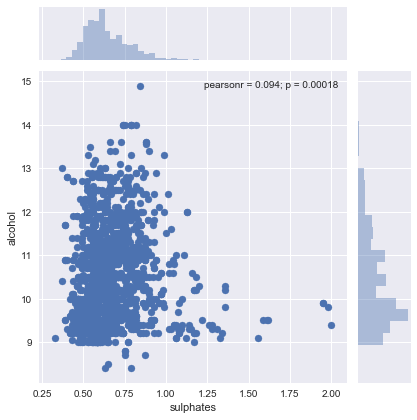

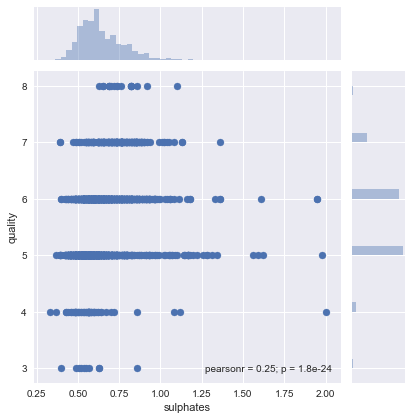

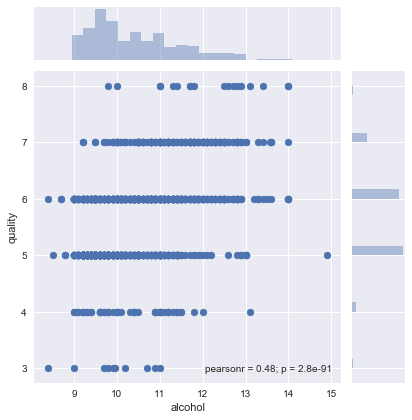

In [7]:
sns.set()
for featureA, featureB in combinations(range(len(dataset.columns)), 2):
    sns.jointplot(x=dataset.columns[featureA], y=dataset.columns[featureB], data=dataset)

In [8]:
def draw_heatmap(data, vmin, vmax, center):
    sns.set()

    f, ax = plt.subplots(figsize=(11, 9))

    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(data, cmap=cmap, vmax=vmax, vmin=vmin, center=center,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

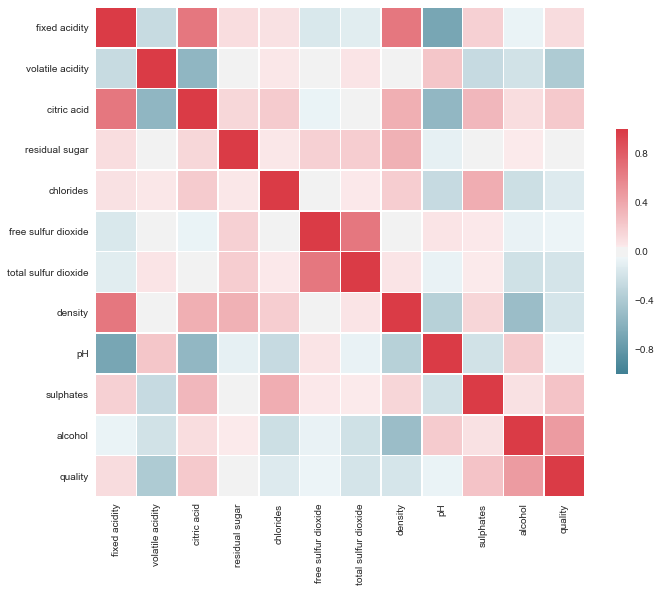

In [9]:
corr = dataset.corr()
draw_heatmap(corr, -1, 1, 0)

In [10]:
cov = dataset.cov()
print(cov)
# draw_heatmap(cov, None, None, 0)

                      fixed acidity  volatile acidity  citric acid  \
fixed acidity              3.031416         -0.079851     0.227820   
volatile acidity          -0.079851          0.032062    -0.019272   
citric acid                0.227820         -0.019272     0.037947   
residual sugar             0.281756          0.000484     0.039434   
chlorides                  0.007679          0.000517     0.001869   
free sulfur dioxide       -2.800921         -0.019674    -0.124252   
total sulfur dioxide      -6.482346          0.450426     0.227697   
density                    0.002195          0.000007     0.000134   
pH                        -0.183586          0.006495    -0.016298   
sulphates                  0.054010         -0.007921     0.010328   
alcohol                   -0.114421         -0.038600     0.022815   
quality                    0.174424         -0.056476     0.035612   

                      residual sugar  chlorides  free sulfur dioxide  \
fixed acidity    

**Yeast Dataset**
-----------------

In [12]:
dataset = pd.read_csv('Data/Datasets/Yeast/yeast.csv', sep=';')
print(dataset.shape)

(1484, 10)


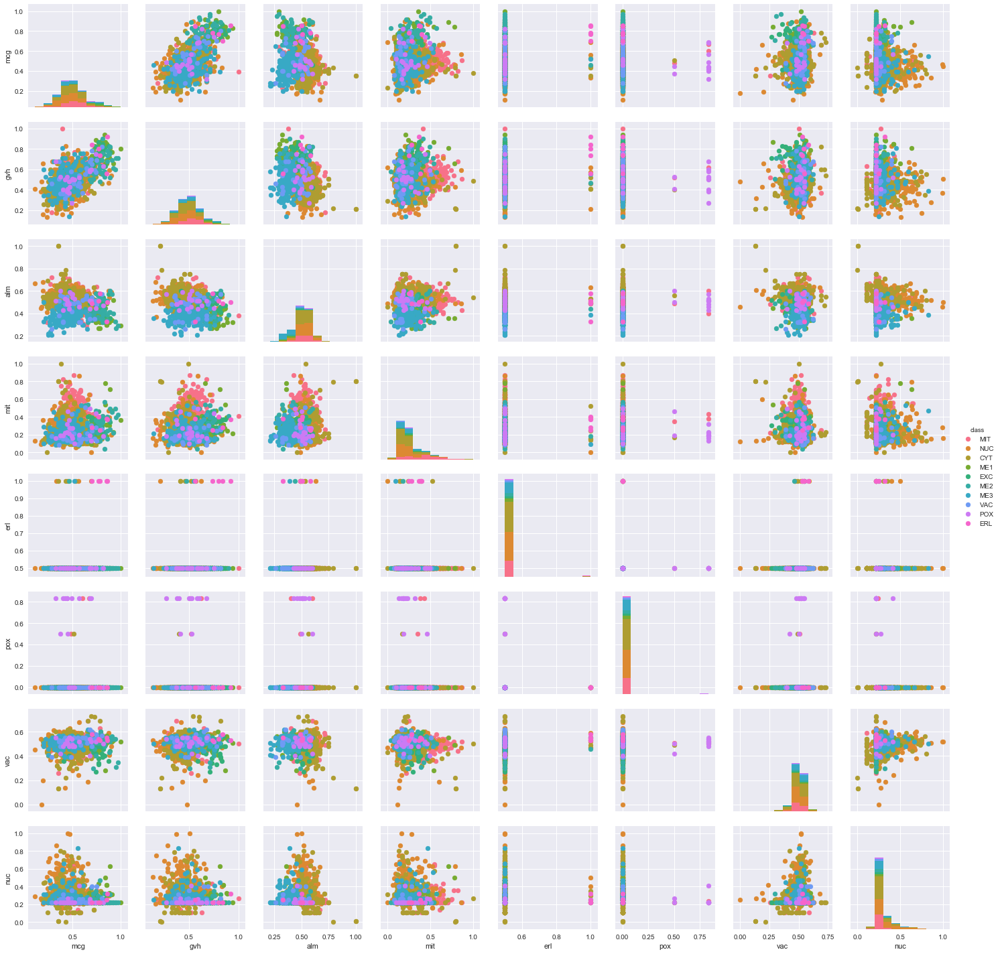

In [13]:
sns.set()
g = sns.PairGrid(dataset, hue="class")
g = g.map_diag(plt.hist)
g = g.map_offdiag(plt.scatter)
g = g.add_legend()

C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: T

C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Programy\Anaconda\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Programy\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warning

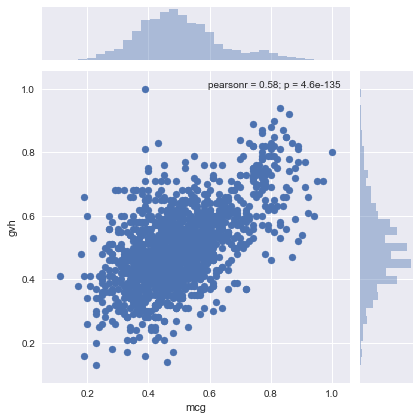

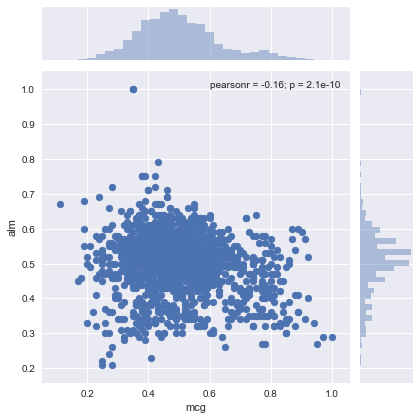

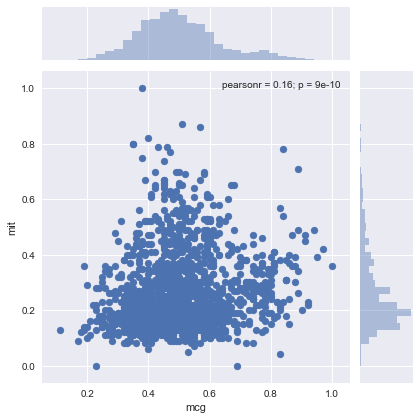

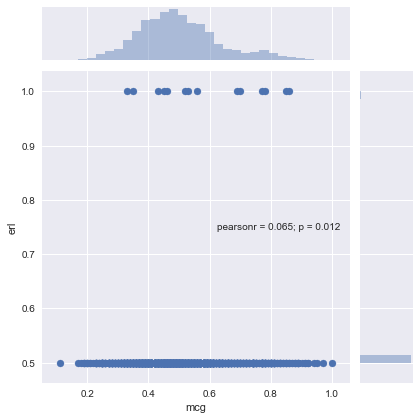

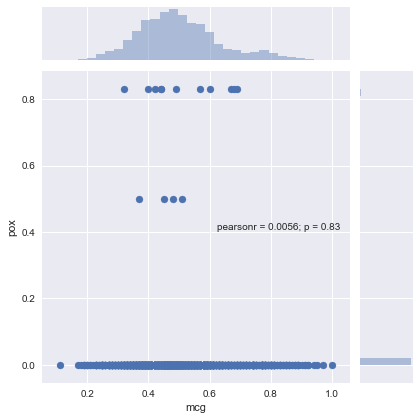

...

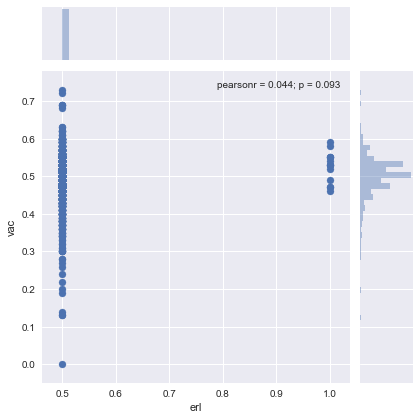

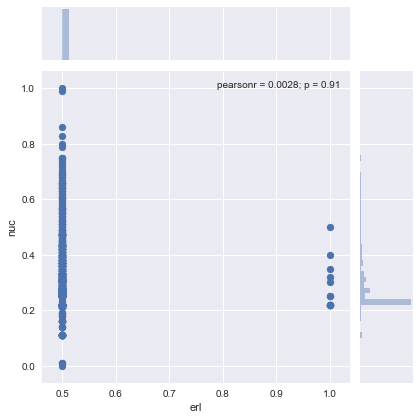

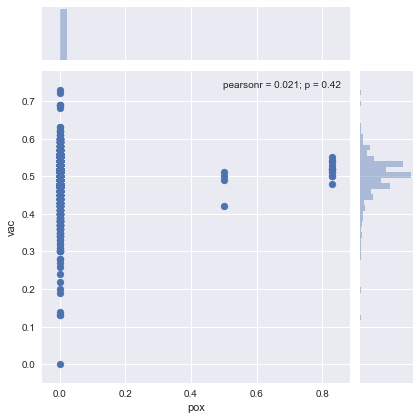

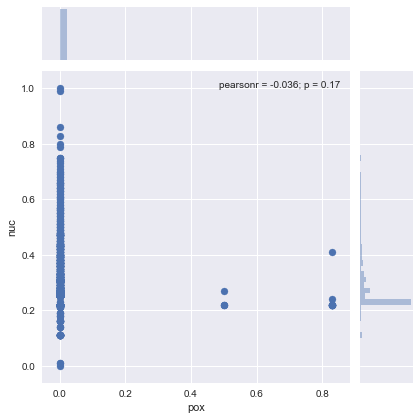

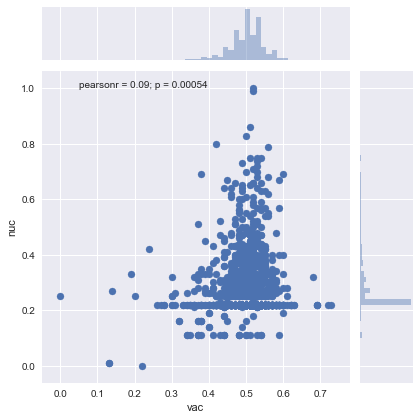

In [14]:
sns.set()
dfRange = dataset.columns[1:-1]
data = dataset[dfRange]
for featureA, featureB in combinations(range(1, 1 + len(dfRange)), 2):
    sns.jointplot(x=dataset.columns[featureA], y=dataset.columns[featureB], data=data)

In [15]:
def draw_heatmap(data, vmin, vmax, center):
    sns.set()

#     mask = np.zeros_like(data, dtype=np.bool)
#     mask[np.triu_indices_from(mask)] = True

    f, ax = plt.subplots(figsize=(11, 9))

    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(data, cmap=cmap, vmax=vmax, vmin=vmin, center=center,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

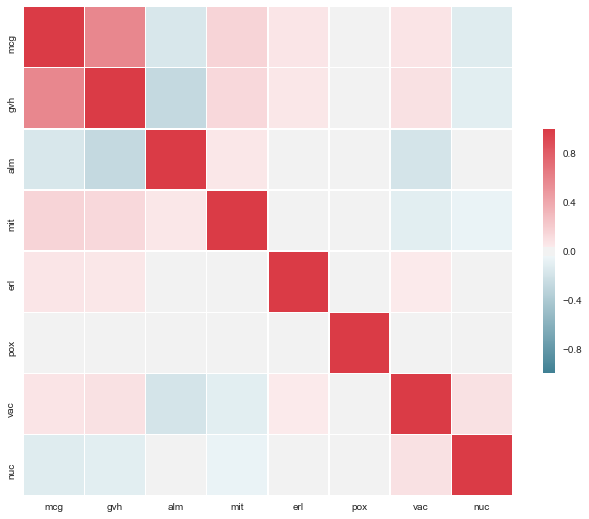

In [16]:
corr = dataset.corr()
draw_heatmap(corr, -1, 1, 0)

In [17]:
cov = dataset.cov()
print(cov)
# draw_heatmap(cov, None, None, 0)

          mcg       gvh       alm       mit       erl       pox       vac  \
mcg  0.018851  0.009896 -0.001951  0.002977  0.000431  0.000058  0.000595   
gvh  0.009896  0.015357 -0.002919  0.002384  0.000364  0.000004  0.000636   
alm -0.001951 -0.002919  0.007512  0.000709 -0.000034  0.000062 -0.000931   
mit  0.002977  0.002384  0.000709  0.018796 -0.000039 -0.000094 -0.000821   
erl  0.000431  0.000364 -0.000034 -0.000039  0.002338 -0.000035  0.000122   
pox  0.000058  0.000004  0.000062 -0.000094 -0.000035  0.005728  0.000091   
vac  0.000595  0.000636 -0.000931 -0.000821  0.000122  0.000091  0.003340   
nuc -0.001821 -0.001359 -0.000203 -0.000800  0.000015 -0.000287  0.000552   

          nuc  
mcg -0.001821  
gvh -0.001359  
alm -0.000203  
mit -0.000800  
erl  0.000015  
pox -0.000287  
vac  0.000552  
nuc  0.011340  
